In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


WEATHER PREDICTION


We are going to predict the weather condition :
* drizzle
* rain
* sun
* snow
* fog

In [4]:
data=pd.read_csv(r"D:\seattle-weather.csv")
data.head(10)

,date,precipitation,temp_max,temp_min,wind,weather
0,1/1/2012,0.0,12.8,5.0,4.7,drizzle
1,1/2/2012,10.9,10.6,2.8,4.5,rain
2,1/3/2012,0.8,11.7,7.2,2.3,rain
3,1/4/2012,20.3,12.2,5.6,4.7,rain
4,1/5/2012,1.3,8.9,2.8,6.1,rain
5,1/6/2012,2.5,4.4,2.2,2.2,rain
6,1/7/2012,0.0,7.2,2.8,2.3,rain
7,1/8/2012,0.0,10.0,2.8,2.0,sun
8,1/9/2012,4.3,9.4,5.0,3.4,rain
9,1/10/2012,1.0,6.1,0.6,3.4,rain


In [5]:
data.shape

(1461, 6)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1461 entries, 0 to 1460
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           1461 non-null   object 
 1   precipitation  1461 non-null   float64
 2   temp_max       1461 non-null   float64
 3   temp_min       1461 non-null   float64
 4   wind           1461 non-null   float64
 5   weather        1461 non-null   object 
dtypes: float64(4), object(2)
memory usage: 68.6+ KB


In [7]:
data.describe()

,precipitation,temp_max,temp_min,wind
count,1461.000000,1461.000000,1461.000000,1461.000000
mean,3.029432,16.439083,8.234771,3.241136
std,6.680194,7.349758,5.023004,1.437825
min,0.000000,-1.600000,-7.100000,0.400000
25%,0.000000,10.600000,4.400000,2.200000
50%,0.000000,15.600000,8.300000,3.000000
75%,2.800000,22.200000,12.200000,4.000000
max,55.900000,35.600000,18.300000,9.500000


<BarContainer object of 5 artists>

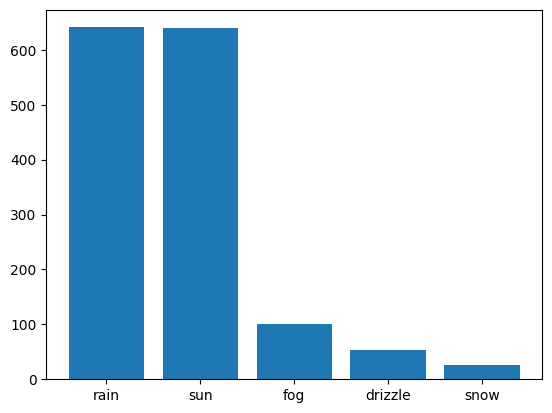

In [8]:
dis=data['weather'].value_counts()
plt.bar(dis.index,dis.values)

In [9]:
data.dtypes

date              object
precipitation    float64
temp_max         float64
temp_min         float64
wind             float64
weather           object
dtype: object

In [10]:
data.isnull().sum()

date             0
precipitation    0
temp_max         0
temp_min         0
wind             0
weather          0
dtype: int64

In [11]:
data.duplicated().sum()

0

In [12]:
data['date']

0         1/1/2012
1         1/2/2012
2         1/3/2012
3         1/4/2012
4         1/5/2012
           ...    
1456    12/27/2015
1457    12/28/2015
1458    12/29/2015
1459    12/30/2015
1460    12/31/2015
Name: date, Length: 1461, dtype: object

In [13]:
data['date']=pd.to_datetime(data['date'])


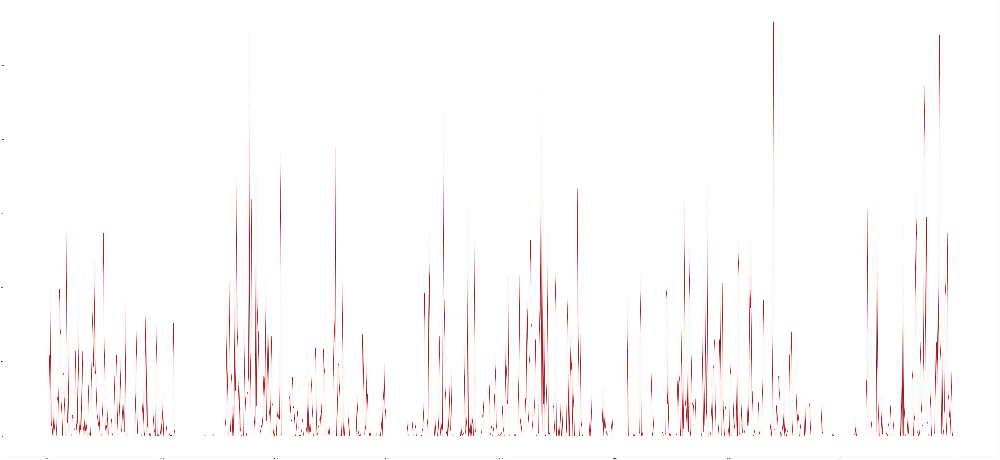

In [14]:


x=data['date']
y=data['precipitation']

plt.figure(figsize=(130,60))
plt.plot(x,y,color='red')

plt.show()

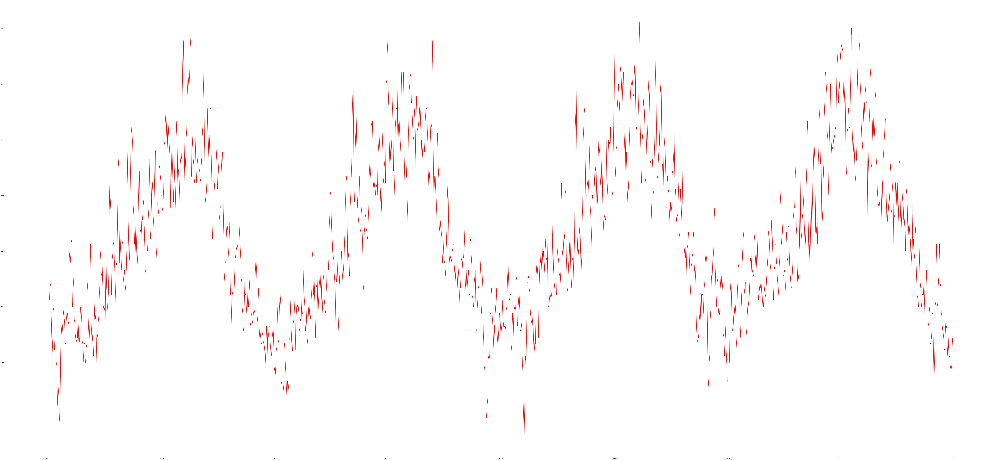

In [15]:


x=data['date']
y=data['temp_max']

plt.figure(figsize=(130,60))
plt.plot(x,y,color='red')

plt.show()

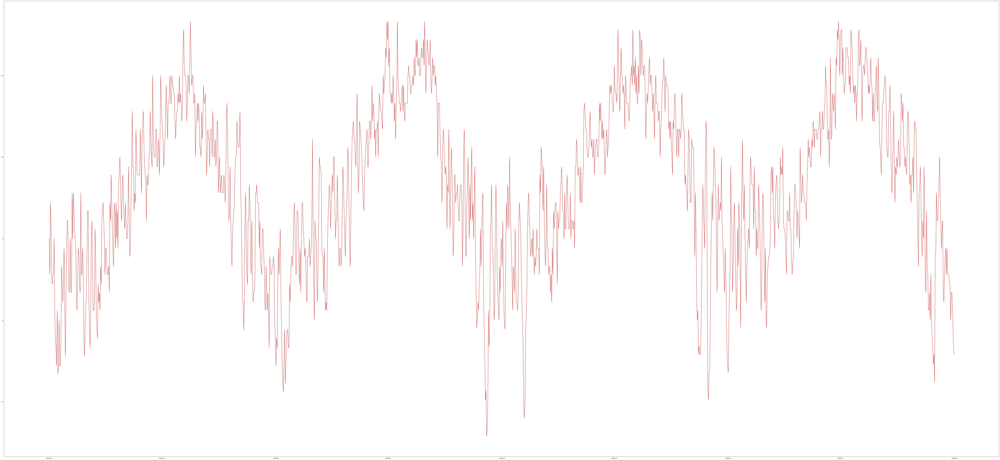

In [16]:


x=data['date']
y=data['temp_min']

plt.figure(figsize=(130,60))
plt.plot(x,y,color='red')

plt.show()

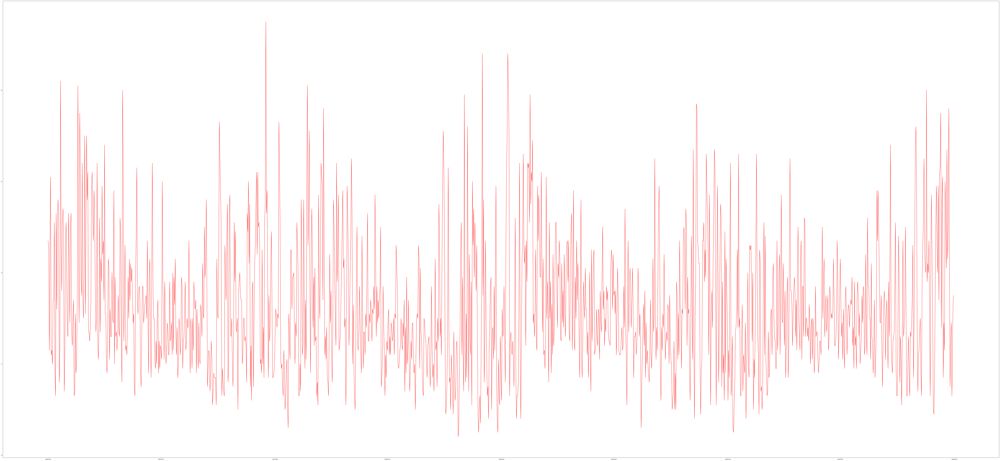

In [17]:

x=data['date']
y=data['wind']

plt.figure(figsize=(130,60))
plt.plot(x,y,color='red')

plt.show()

In [18]:
#data day year month extraction
data['Day']=data['date'].dt.day
data['Month']=data['date'].dt.month
data['Year']=data['date'].dt.year
data.drop('date',axis=1,inplace=True)

In [19]:
data.head()

,precipitation,temp_max,temp_min,wind,weather,Day,Month,Year
0,0.0,12.8,5.0,4.7,drizzle,1,1,2012
1,10.9,10.6,2.8,4.5,rain,2,1,2012
2,0.8,11.7,7.2,2.3,rain,3,1,2012
3,20.3,12.2,5.6,4.7,rain,4,1,2012
4,1.3,8.9,2.8,6.1,rain,5,1,2012


In [20]:
data['Year'].value_counts()

Year
2012    366
2013    365
2014    365
2015    365
Name: count, dtype: int64

In [21]:
print(data.groupby('weather').count())

         precipitation  temp_max  temp_min  wind  Day  Month  Year
weather                                                           
drizzle             53        53        53    53   53     53    53
fog                101       101       101   101  101    101   101
rain               641       641       641   641  641    641   641
snow                26        26        26    26   26     26    26
sun                640       640       640   640  640    640   640


Label Encoding 

In [22]:
from sklearn.preprocessing import LabelEncoder
encoder=LabelEncoder()
weather_enc=encoder.fit_transform(data['weather'])
print(weather_enc)

[0 2 2 ... 1 4 4]


In [23]:
data['weather_enc']=weather_enc
data.head()

,precipitation,temp_max,temp_min,wind,weather,Day,Month,Year,weather_enc
0,0.0,12.8,5.0,4.7,drizzle,1,1,2012,0
1,10.9,10.6,2.8,4.5,rain,2,1,2012,2
2,0.8,11.7,7.2,2.3,rain,3,1,2012,2
3,20.3,12.2,5.6,4.7,rain,4,1,2012,2
4,1.3,8.9,2.8,6.1,rain,5,1,2012,2


In [24]:
data[['weather','weather_enc']].value_counts()

weather  weather_enc
rain     2              641
sun      4              640
fog      1              101
drizzle  0               53
snow     3               26
Name: count, dtype: int64

weather  weather_enc


rain   ->  2              
sun    ->  4              
fog    ->  1              
drizzle -> 0              
snow    -> 3               

In [25]:

data.dtypes

precipitation    float64
temp_max         float64
temp_min         float64
wind             float64
weather           object
Day                int32
Month              int32
Year               int32
weather_enc        int32
dtype: object

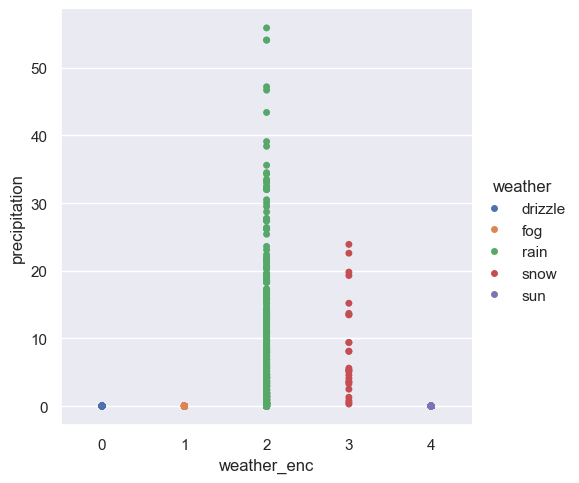

In [26]:
import seaborn as sns
sns.set_theme(style="darkgrid")
sns.catplot(data,x='weather_enc',y='precipitation' ,hue='weather',jitter=False)



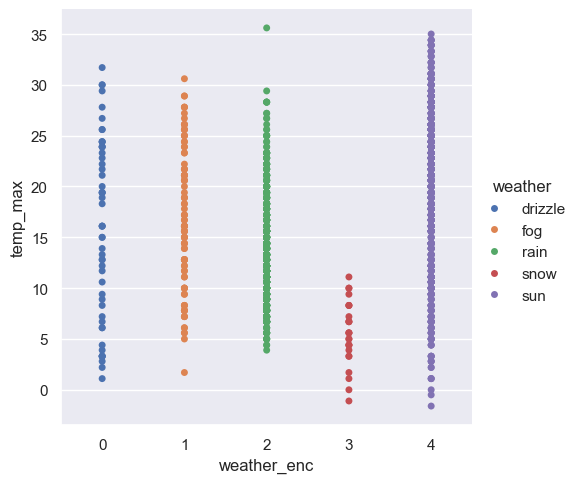

In [27]:

sns.catplot(data,x='weather_enc',y='temp_max',hue='weather' ,jitter=False)


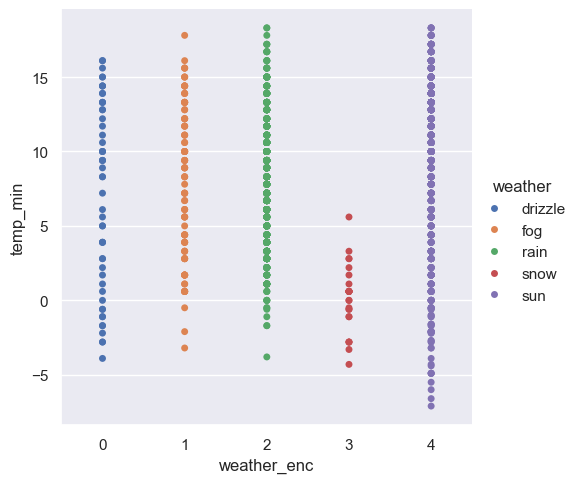

In [28]:
sns.catplot(data,x='weather_enc',y='temp_min',hue='weather' ,jitter=False)

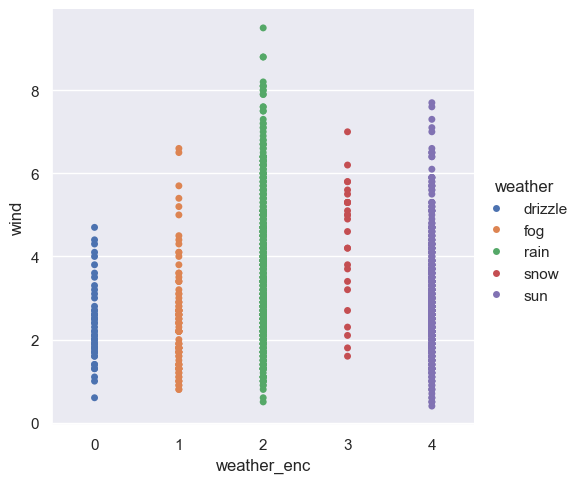

In [29]:
sns.catplot(data,x='weather_enc',y='wind',hue='weather' ,jitter=False)

In [30]:
data.drop('weather',axis=1,inplace=True)

In [31]:
#SPITTING DATA INTO TRAIN TEST (80-20)
from sklearn.model_selection import train_test_split
X=data[['precipitation','temp_max','temp_min','wind']]
Y=data['weather_enc']


In [32]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=42)

In [33]:
print(X_train.shape,Y_train.shape,X_test.shape,Y_test.shape)

(1168, 4) (1168,) (293, 4) (293,)


FEATURE SELECTION

In [34]:
from sklearn.feature_selection import VarianceThreshold
#To remove constant or near constant features
constant_filter = VarianceThreshold(threshold=0)
constant_filter.fit(X_train)
len(X_train.columns[constant_filter.get_support()])

4

In [35]:
#Find constant columns
constant_columns = [column for column in X_train.columns
                    if column not in X_train.columns[constant_filter.get_support()]]
print(len(constant_columns))

0


In [36]:
from sklearn.feature_selection import VarianceThreshold
sel=VarianceThreshold(threshold=0.6)
sel.fit(X_train)

VarianceThreshold(threshold=0.6)

In [37]:
sel.variances_

array([46.02314692, 53.24687013, 24.9548582 ,  2.04006849])

In [38]:
# We will be considering - precipitation  ,temp_max  , wind features
X_train.drop('wind',axis=1,inplace=True)
X_test.drop('wind',axis=1,inplace=True)

In [ ]:
from sklearn.linear_model import LogisticRegression
LogisticR=LogisticRegression()
LogisticR.fit(X_train,Y_train)

In [51]:
from sklearn.metrics import accuracy_score
#predictions on the testing data


LP=LogisticR.predict(X_test)



array([4, 2, 4, 4, 2, 2, 4, 4, 2, 4, 4, 4, 2, 4, 4, 2, 4, 4, 4, 4, 2, 4,
       2, 4, 4, 2, 4, 4, 4, 4, 2, 4, 4, 2, 4, 2, 2, 2, 2, 4, 2, 4, 4, 4,
       4, 2, 2, 4, 2, 4, 4, 2, 4, 2, 4, 2, 2, 4, 2, 4, 2, 4, 2, 4, 4, 4,
       2, 4, 2, 2, 2, 4, 4, 2, 2, 4, 2, 4, 2, 2, 2, 4, 2, 4, 2, 4, 4, 2,
       4, 2, 2, 4, 4, 2, 2, 4, 4, 2, 4, 2, 4, 4, 2, 3, 2, 4, 4, 2, 4, 2,
       2, 4, 2, 2, 4, 4, 4, 4, 4, 2, 2, 2, 2, 2, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 2, 2, 2, 4, 4, 4, 2, 2, 4, 4, 4, 2, 4, 4, 2, 4, 4, 4,
       2, 2, 4, 4, 2, 2, 4, 4, 2, 4, 4, 2, 2, 4, 4, 4, 2, 2, 4, 4, 2, 2,
       4, 4, 4, 2, 4, 4, 4, 2, 2, 4, 2, 2, 4, 4, 4, 4, 4, 2, 4, 4, 4, 2,
       2, 2, 2, 4, 4, 2, 4, 2, 2, 4, 2, 4, 2, 4, 4, 4, 4, 4, 4, 4, 2, 4,
       2, 4, 4, 4, 4, 2, 4, 2, 4, 2, 4, 2, 4, 4, 2, 4, 4, 4, 4, 4, 2, 2,
       4, 2, 4, 4, 4, 4, 2, 2, 2, 2, 2, 4, 4, 4, 2, 4, 2, 2, 2, 2, 4, 2,
       4, 4, 2, 4, 4, 4, 4, 4, 4, 2, 4, 4, 2, 2, 4, 4, 4, 2, 4, 4, 4, 4,
       2, 4, 4, 2, 4, 2, 4])

In [52]:
accuracy_logistic = accuracy_score(Y_test,LP)
print(accuracy_logistic)

0.8327645051194539


In [53]:
newtest = pd.DataFrame({'precipitation': 0.0, 'temp_max': 23.9, 'temp_min': 11.1}, index=[1])
LP=LogisticR.predict(newtest)


In [49]:
print(LP)

[4]
